# Generate Flood Maps with OPERA DSWx-S1 products
## This tutorial demonstrates how to query and work with the OPERA DSWx-S1 Provisional Data products.

---    

### Data Used in the Example:   

- **30 meter (m) near-global OPERA Dynamic Surface Water eXtent from Sentinel-1 (DSWx-S1) provisional product (Version 0)**
    - This dataset contains Level-3 Dynamic OPERA Dynamic Surface Water eXtent from Sentinel-1 (DSWx-S1) provisional product version 0. The data are provisional non-validated surface water extent observations over selective locations and times spanning from September 2023 to July 2024. The input dataset for generating each product is the the OPERA Level-2 Radiometric Terrain Corrected SAR Backscatter product from Sentinel-1 data (RTC-S1). The OPERA RTC-S1 products provide the radiometric terrain corrected γ0 backscatter coefficient in geocoded burst domain, approximately every 6 to 12 days. The OPERA RTC-S1 products are produced and distributed in the Universal Transverse Mercator (UTM) coordinate System for each single burst. The DSWx-S1 products will be produced over Military Grid Reference System (MGRS) tiles that each cover an area of 109.8 km × 109.8 km. This area is divided into 3,660 rows and 3,660 columns at 30-m pixel spacing. Each product is distributed as a set of 3 GeoTIFF (Geographic Tagged Image File Format) files including water classification, binary water,, and associated confidence.
     - **Science Dataset (SDS) layers: Vietnam Floods**
        - In October 2023, central-northern Vietnam was affected by heavy rain and flooding, resulting in ~1500 damaged homes and thousands of evacuations [[RW](https://reliefweb.int/report/viet-nam/vietnam-floods-adinet-vietnam-meteorological-and-hydrological-administration-echo-daily-flash-17-october-2023)]. Here, we demonstrate how DSWx-S1 can be used to map inundation extent as a result of the flooding event in October 2023.
        - B02_BWTR (Binary Water Layer)  
        - B03_CONF (Confidence Layer)  

Please refer to the [OPERA Product Specification Document](https://d2pn8kiwq2w21t.cloudfront.net/documents/ProductSpec_DSWX_S1.pdf) for details about the DSWx-S1 product.

---

## Before Starting this Tutorial  

A [NASA Earthdata Login](https://urs.earthdata.nasa.gov/) account is required to download the data used in this tutorial. You can create an account at the link provided.

---
## 1. Getting Started <a id="getstarted"></a>

### 1.1 Import Packages <a id="1.1"></a>

In [1]:
%load_ext autoreload
%autoreload 2

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
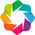

In [2]:
import os
import sys
from datetime import datetime
import warnings

import folium
import geoviews as gv
import geopandas as gpd
import holoviews as hv
from folium import plugins
from rioxarray.merge import merge_arrays
from shapely.geometry import Polygon, box, shape

# Holoviews and Geoviews extensions
hv.extension('bokeh')
gv.extension('bokeh', 'matplotlib')

# Local application/library-specific imports
sys.path.append('../../')
from src.dswx_utils import (
    colorize,
    getbasemaps,
    transform_data_for_folium,
    query_s3_bucket
)

# Suppress warnings
warnings.filterwarnings('ignore')

### 1.2 Set up Working Environment <a id="1.2"></a>

In [3]:
inDir = os.getcwd()
os.chdir(inDir)

## 2. Access data locally <a id="searchstac"></a>

### 2.1 Initialize user-defined parameters <a id="2.1"></a>

In [4]:
# USER-DEFINED PARAMETERS
aoi = box(105.65799, 16.09217, 108.59497, 18.14971)
start_date = datetime(2023, 10, 7)                                      # in 2022-01-01 00:00:00 format
stop_date = datetime(2023, 10, 19)                                      # in 2022-01-01 00:00:00 format
overlap_threshold = 10                                                  # in percent

print(f"Event interval between {start_date} and {stop_date}")
print(f"With AOI: {aoi.__geo_interface__}")

Event interval between 2023-10-07 00:00:00 and 2023-10-19 00:00:00
With AOI: {'type': 'Polygon', 'coordinates': (((108.59497, 16.09217), (108.59497, 18.14971), (105.65799, 18.14971), (105.65799, 16.09217), (108.59497, 16.09217)),)}


In [5]:
# get list of BWTR layers
bwtr_ext = '_B02_BWTR.tif'
conf_ext = '_B03_CONF.tif'

# Define the bucket name
bucket_name = 'opera-provisional-products'

# Get the list of files matching the wildcard pattern
bwtr_pattern = f'DSWx/DSWx_S1/beta/v0.1/Vietnam_2023/*/*{bwtr_ext}'
bwtr_lyrs = query_s3_bucket(bucket_name, bwtr_pattern)

In [6]:
# ls DSWx-S1_vietnam/

In [7]:
#bwtr_lyrs_tst, bwtr_lyrs_cm = transform_data_for_folium(bwtr_lyrs[0])
#bwtr_lyrs_tst.rio.transform()
#bwtr_lyrs_tst.rio.bounds()

In [8]:
# Create a dataframe, and pass only tiles that intersect with the user-defined bbox
search_dswx = gpd.GeoDataFrame(columns=['bwtr_name', 'conf_name', 'TileID',
                                        'Sensor', 'Date', 'Coords', 'bbox',
                                        'SpatialOverlap', 'geometry'], crs='EPSG:4326')
for i in bwtr_lyrs:
    # get iterative names
    fname_base = os.path.basename(i.split(bwtr_ext)[0])
    conf_name = i.split(bwtr_ext)[0] + conf_ext
    fn = os.path.basename(i).split('_')
    ID = fn[3]
    sensor = fn[6]
    dat = datetime.strptime(fn[4], '%Y%m%dT%H%M%SZ')

    ## get geometry
    ds, _ = transform_data_for_folium(i)
    ds_bounds = ds.rio.bounds()
    x_max = ds_bounds[2]
    x_min = ds_bounds[0]
    y_max = ds_bounds[3]
    y_min = ds_bounds[1]
    # Create a Polygon geometry
    ds_polygon = Polygon([(x_min, y_min), (x_min, y_max),
                         (x_max, y_max), (x_max, y_min)])
    coords = [i for i in ds_polygon.exterior.coords]
    bbox = ds_polygon.bounds

    # get intersection
    intersected_geom = ds_polygon.intersection(aoi)
    spatial_overlap = (intersected_geom.area * 100) / ds_polygon.area

    # Query DSWx-S1 tiles based on spatial overlap with respect to defined AOI
    if spatial_overlap > overlap_threshold:
        # Create a dictionary for the new row
        new_row = {'bwtr_name': i,
                   'conf_name': conf_name,
                   'TileID': ID,
                   'Sensor': sensor,
                   'Date': dat,
                   'Coords': coords,
                   'bbox': bbox,
                   'SpatialOverlap': spatial_overlap,
                   'geometry': ds_polygon}
        # Convert the dictionary to a GeoDataFrame
        new_gdf = gpd.GeoDataFrame([new_row], crs='EPSG:4326')
        # Append the new GeoDataFrame to the existing one
        search_dswx = search_dswx.append(new_gdf, ignore_index=True)


In [9]:
## View snippet of dataframe
search_dswx.head()

,bwtr_name,conf_name,TileID,Sensor,Date,Coords,bbox,SpatialOverlap,geometry
0,s3://opera-provisional-products/DSWx/DSWx_S1/b...,s3://opera-provisional-products/DSWx/DSWx_S1/b...,T48QWD,S1A,2023-10-07 22:44:02,"[(104.99981192093202, 16.190050349013365), (10...","(104.99981192093202, 16.190050349013365, 106.0...",36.255067,"POLYGON ((104.99981 16.19005, 104.99981 17.184..."
1,s3://opera-provisional-products/DSWx/DSWx_S1/b...,s3://opera-provisional-products/DSWx/DSWx_S1/b...,T48QWE,S1A,2023-10-07 22:44:02,"[(104.99981098077862, 17.093901735491908), (10...","(104.99981098077862, 17.093901735491908, 106.0...",36.563860,"POLYGON ((104.99981 17.09390, 104.99981 18.089..."
2,s3://opera-provisional-products/DSWx/DSWx_S1/b...,s3://opera-provisional-products/DSWx/DSWx_S1/b...,T48QXD,S1A,2023-10-07 22:44:02,"[(105.93550862813808, 16.183329589043968), (10...","(105.93550862813808, 16.183329589043968, 106.9...",100.000000,"POLYGON ((105.93551 16.18333, 105.93551 17.182..."
3,s3://opera-provisional-products/DSWx/DSWx_S1/b...,s3://opera-provisional-products/DSWx/DSWx_S1/b...,T48QXE,S1A,2023-10-07 22:44:02,"[(105.93990462637001, 17.087081868841366), (10...","(105.93990462637001, 17.087081868841366, 106.9...",100.000000,"POLYGON ((105.93990 17.08708, 105.93990 18.086..."
4,s3://opera-provisional-products/DSWx/DSWx_S1/b...,s3://opera-provisional-products/DSWx/DSWx_S1/b...,T48QYD,S1A,2023-10-07 22:44:02,"[(106.87037309362458, 16.1727708230442), (106....","(106.87037309362458, 16.1727708230442, 107.911...",100.000000,"POLYGON ((106.87037 16.17277, 106.87037 17.176..."


In [10]:
## Print search information
# Total granules
print(f"{len(search_dswx)} granules after search filter, out of {len(bwtr_lyrs)} total")

# Check percent overlap values
min_index = search_dswx['SpatialOverlap'].idxmin()
print(f"tile {search_dswx.loc[min_index]['bwtr_name']} \n" + \
      f"has the minimum spatial overlap in the set of {min(search_dswx['SpatialOverlap']):.2f} \n\n")

max_index = search_dswx['SpatialOverlap'].idxmax()
print(f"tile {search_dswx.loc[max_index]['bwtr_name']} \n" + \
      f"has the maximum spatial overlap in the set of {max(search_dswx['SpatialOverlap']):.2f}")

34 granules after search filter, out of 38 total
tile s3://opera-provisional-products/DSWx/DSWx_S1/beta/v0.1/Vietnam_2023/20231007/OPERA_L3_DSWx-S1_T48QWD_20231007T224402Z_20240212T133812Z_S1A_30_v0.1_B02_BWTR.tif 
has the minimum spatial overlap in the set of 36.26 


tile s3://opera-provisional-products/DSWx/DSWx_S1/beta/v0.1/Vietnam_2023/20231007/OPERA_L3_DSWx-S1_T48QXD_20231007T224402Z_20240212T133812Z_S1A_30_v0.1_B02_BWTR.tif 
has the maximum spatial overlap in the set of 100.00


In [11]:
# Visualize the DSWx tile boundary and the user-defined bbox
granules_poly = gv.Polygons(search_dswx['geometry'], label='DSWx tile boundary').opts(line_color='blue', color=None, show_legend=True)

# Use geoviews to combine a basemap with the shapely polygon of our Region of Interest (ROI)
base = gv.tile_sources.EsriImagery.opts(width=1000, height=1000)

# Get the user-specified aoi
intersects_geometry = aoi.__geo_interface__
geom_aoi = shape(intersects_geometry)
aoi_poly = gv.Polygons(geom_aoi, label='User-specified bbox').opts(line_color='yellow', color=None, show_legend=True)

# Plot using geoviews wrapper
granules_poly*base*aoi_poly

:Overlay
   .Polygons.DSWx_tile_boundary               :Polygons   [Longitude,Latitude]
   .WMTS.I                                    :WMTS   [Longitude,Latitude]
   .Polygons.User_hyphen_minus_specified_bbox :Polygons   [Longitude,Latitude]

## 3. Load and visualize the flood extent <a id="loadandvizdswx"></a>

### 3.1.a Merge tiles for pre-flood image <a id="3.1.a"></a>

In [12]:
# calculate difference in time between tile acquisition and specified start date
search_dswx['TimeDiff'] = (search_dswx['Date'] - start_date).abs()
index_of_closest_date = search_dswx['TimeDiff'].idxmin()

# determine closest acquisition date
capture_date = search_dswx.loc[index_of_closest_date]['Date']
pre_flood_tiles = search_dswx[search_dswx['Date'] == capture_date]

# capture relevant images to merge
pre_flood_bwrt = pre_flood_tiles['bwtr_name'].to_list()
pre_flood_conf = pre_flood_tiles['conf_name'].to_list()

# drop time delta column
search_dswx.drop(columns=['TimeDiff'], inplace=True)

In [13]:
# merge all BWTR layers
transformed_BWTR_arr = []
for i in pre_flood_bwrt:
    transformed_arr, cm_BWTR = transform_data_for_folium(i)
    transformed_BWTR_arr.append(transformed_arr)
merged_BWTR = merge_arrays(transformed_BWTR_arr)

# merge all CONF layers
transformed_CONF_arr = []
for i in pre_flood_conf:
    transformed_arr, cm_CONF = transform_data_for_folium(i)
    transformed_CONF_arr.append(transformed_arr)
merged_CONF = merge_arrays(transformed_CONF_arr)

# Check one of the DataArrays
merged_BWTR

<xarray.DataArray (band: 1, y: 6990, x: 15278)>
array([[[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]]], dtype=uint8)
Coordinates:
  * x            (x) float64 105.0 105.0 105.0 105.0 ... 109.2 109.2 109.2 109.2
  * y            (y) float64 18.09 18.09 18.09 18.09 ... 16.16 16.16 16.16 16.16
  * band         (band) int64 1
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:                                                         Area
    CONTACT_INFORMATION:                                                   op...
    DSWX_PRODUCT_VERSION:                                                  0.1
    INPUT_DEM_SOURCE:                                                      Co...
    INPUT_HAND_SOURCE:                                                     AS...
    INPUT_REFERENCE_WATER_SOURCE:                                          JR...
    INPUT_SHORELINE_SOURCE:                                                NO...
    INPUT_WORLDCOVER_SOURCE:                                               ES...
    INSTITUTION:                                                           NA...
    LAYOVER_SHADOW_COVERAGE:                                               0.0
    MGRS_COLLECTION_ACTUAL_NUMBER_OF_BURSTS:                               40
    MGRS_COLLECTION_EXPECTED_NUMBER_OF_BURSTS:                             40
    MGRS_COLLECTION_MISSING_NUMBER_OF_BURSTS:                              0
    PROCESSING_DATETIME:                                                   20...
    PROCESSING_INFORMATION_FILTER:                                         En...
    PROCESSING_INFORMATION_FILTER_ENABLED:                                 True
    PROCESSING_INFORMATION_FILTER_WINDOW_SIZE:                             5
    PROCESSING_INFORMATION_FUZZY_VALUE_AREA:                               [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_DARK_AREA:                          [-...
    PROCESSING_INFORMATION_FUZZY_VALUE_HAND:                               [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_HIGH_FREQUENT_AREA:                 [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_REFERENCE_WATER:                    [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_SLOPE:                              [0...
    PROCESSING_INFORMATION_INUNDATED_VEGETATION:                           True
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_CROSS_POL_MIN:             -26
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_DUAL_POL_RATIO_MAX:        12
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_DUAL_POL_RATIO_MIN:        7
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_DUAL_POL_RATIO_THRESHOLD:  8
    PROCESSING_INFORMATION_MASKING_ANCILLARY_CO_POL_THRESHOLD:             -14.6
    PROCESSING_INFORMATION_MASKING_ANCILLARY_CROSS_POL_THRESHOLD:          -22.8
    PROCESSING_INFORMATION_MASKING_ANCILLARY_WATER_THRESHOLD:              0.05
    PROCESSING_INFORMATION_POLARIZATION:                                   ['...
    PROCESSING_INFORMATION_REFINE_BIMODALITY_MINIMUM_PIXEL:                4
    PROCESSING_INFORMATION_REFINE_BIMODALITY_THRESHOLD:                    [1...
    PROCESSING_INFORMATION_REGION_GROWING_INITIAL_SEED:                    0.81
    PROCESSING_INFORMATION_REGION_GROWING_RELAXED_THRESHOLD:               0.51
    PROCESSING_INFORMATION_THRESHOLDING:                                   Ki...
    PROCESSING_INFORMATION_THRESHOLD_BIMODALITY:                           0.7
    PROCESSING_INFORMATION_THRESHOLD_MULTI_THRESHOLD:                      True
    PROCESSING_INFORMATION_THRESHOLD_TILE_AVERAGE:                         True
    PROCESSING_INFORMATION_THRESHOLD_TILE_SELECTION:                       ['...
    PROCESSING_INFORMATION_THRESHOLD_TWELE:                                [0...
    PRODUCT_LEVEL:                                   

### 3.1.b Visualize merged pre-flood tiles using Folium <a id="3.1.b"></a>

In [14]:
# Colorize the map using predefined colors from DSWx for Folium display
colored_BWTR,cmap_BWTR = colorize(merged_BWTR[0], cmap=cm_BWTR)
colored_CONF,cmap_CONF = colorize(merged_CONF[0], cmap=cm_CONF) 

In [15]:
# Initialize Folium basemap
xmid =(merged_BWTR.x.values.min()+merged_BWTR.x.values.max())/2 ; ymid = (merged_BWTR.y.values.min()+merged_BWTR.y.values.max())/2
m = folium.Map(location=[ymid, xmid], zoom_start=9, tiles='CartoDB positron', show=True)

# Add custom basemaps
basemaps = getbasemaps()
for basemap in basemaps:
    basemaps[basemap].add_to(m)

# Overlay B02 and B03 layers
folium.raster_layers.ImageOverlay(colored_BWTR, 
                                  opacity=0.6, 
                                  bounds=[[merged_BWTR.y.values.min(),merged_BWTR.x.values.min()],[merged_BWTR.y.values.max(),merged_BWTR.x.values.max()]],
                                  name='Flooded Area',
                                  show=True).add_to(m)

folium.raster_layers.ImageOverlay(colored_CONF, 
                                  opacity=0.8, 
                                  bounds=[[merged_CONF.y.values.min(),merged_CONF.x.values.min()],[merged_CONF.y.values.max(),merged_CONF.x.values.max()]],
                                  name='Confidence Layer', 
                                  show=False).add_to(m)

# layer control
m.add_child(folium.LayerControl())

# Add fullscreen button
plugins.Fullscreen().add_to(m)

# Add inset minimap image
minimap = plugins.MiniMap(width=300, height=300)
m.add_child(minimap)

# Mouse Position
fmtr = "function(num) {return L.Util.formatNum(num, 3) + ' º ';};"
plugins.MousePosition(position='bottomright', separator=' | ', prefix="Lat/Lon:",
                     lat_formatter=fmtr, lng_formatter=fmtr).add_to(m)

# Display
m

### 3.2.a Merge tiles for post-flood image <a id="3.2.a"></a>

In [16]:
# calculate difference in time between tile acquisition and specified start date
search_dswx['TimeDiff'] = (search_dswx['Date'] - stop_date).abs()
index_of_closest_date = search_dswx['TimeDiff'].idxmin()

# determine closest acquisition date
capture_date = search_dswx.loc[index_of_closest_date]['Date']
post_flood_tiles = search_dswx[search_dswx['Date'] == capture_date]

# capture relevant images to merge
post_flood_bwrt = post_flood_tiles['bwtr_name'].to_list()
post_flood_conf = post_flood_tiles['conf_name'].to_list()

# drop time delta column
search_dswx.drop(columns=['TimeDiff'], inplace=True)

In [17]:
# merge all BWTR layers
transformed_BWTR_arr = []
for i in pre_flood_bwrt:
    transformed_arr, cm_BWTR = transform_data_for_folium(i)
    transformed_BWTR_arr.append(transformed_arr)
merged_BWTR = merge_arrays(transformed_BWTR_arr)

# merge all CONF layers
transformed_CONF_arr = []
for i in pre_flood_conf:
    transformed_arr, cm_CONF = transform_data_for_folium(i)
    transformed_CONF_arr.append(transformed_arr)
merged_CONF = merge_arrays(transformed_CONF_arr)

# Check one of the DataArrays
merged_BWTR

<xarray.DataArray (band: 1, y: 6990, x: 15278)>
array([[[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]]], dtype=uint8)
Coordinates:
  * x            (x) float64 105.0 105.0 105.0 105.0 ... 109.2 109.2 109.2 109.2
  * y            (y) float64 18.09 18.09 18.09 18.09 ... 16.16 16.16 16.16 16.16
  * band         (band) int64 1
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:                                                         Area
    CONTACT_INFORMATION:                                                   op...
    DSWX_PRODUCT_VERSION:                                                  0.1
    INPUT_DEM_SOURCE:                                                      Co...
    INPUT_HAND_SOURCE:                                                     AS...
    INPUT_REFERENCE_WATER_SOURCE:                                          JR...
    INPUT_SHORELINE_SOURCE:                                                NO...
    INPUT_WORLDCOVER_SOURCE:                                               ES...
    INSTITUTION:                                                           NA...
    LAYOVER_SHADOW_COVERAGE:                                               0.0
    MGRS_COLLECTION_ACTUAL_NUMBER_OF_BURSTS:                               40
    MGRS_COLLECTION_EXPECTED_NUMBER_OF_BURSTS:                             40
    MGRS_COLLECTION_MISSING_NUMBER_OF_BURSTS:                              0
    PROCESSING_DATETIME:                                                   20...
    PROCESSING_INFORMATION_FILTER:                                         En...
    PROCESSING_INFORMATION_FILTER_ENABLED:                                 True
    PROCESSING_INFORMATION_FILTER_WINDOW_SIZE:                             5
    PROCESSING_INFORMATION_FUZZY_VALUE_AREA:                               [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_DARK_AREA:                          [-...
    PROCESSING_INFORMATION_FUZZY_VALUE_HAND:                               [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_HIGH_FREQUENT_AREA:                 [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_REFERENCE_WATER:                    [0...
    PROCESSING_INFORMATION_FUZZY_VALUE_SLOPE:                              [0...
    PROCESSING_INFORMATION_INUNDATED_VEGETATION:                           True
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_CROSS_POL_MIN:             -26
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_DUAL_POL_RATIO_MAX:        12
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_DUAL_POL_RATIO_MIN:        7
    PROCESSING_INFORMATION_INUNDATED_VEGETATION_DUAL_POL_RATIO_THRESHOLD:  8
    PROCESSING_INFORMATION_MASKING_ANCILLARY_CO_POL_THRESHOLD:             -14.6
    PROCESSING_INFORMATION_MASKING_ANCILLARY_CROSS_POL_THRESHOLD:          -22.8
    PROCESSING_INFORMATION_MASKING_ANCILLARY_WATER_THRESHOLD:              0.05
    PROCESSING_INFORMATION_POLARIZATION:                                   ['...
    PROCESSING_INFORMATION_REFINE_BIMODALITY_MINIMUM_PIXEL:                4
    PROCESSING_INFORMATION_REFINE_BIMODALITY_THRESHOLD:                    [1...
    PROCESSING_INFORMATION_REGION_GROWING_INITIAL_SEED:                    0.81
    PROCESSING_INFORMATION_REGION_GROWING_RELAXED_THRESHOLD:               0.51
    PROCESSING_INFORMATION_THRESHOLDING:                                   Ki...
    PROCESSING_INFORMATION_THRESHOLD_BIMODALITY:                           0.7
    PROCESSING_INFORMATION_THRESHOLD_MULTI_THRESHOLD:                      True
    PROCESSING_INFORMATION_THRESHOLD_TILE_AVERAGE:                         True
    PROCESSING_INFORMATION_THRESHOLD_TILE_SELECTION:                       ['...
    PROCESSING_INFORMATION_THRESHOLD_TWELE:                                [0...
    PRODUCT_LEVEL:                                   

### 3.2.b Visualize merged post-flood tiles using Folium <a id="3.2.b"></a>

In [18]:
# Colorize the map using predefined colors from DSWx for Folium display
colored_BWTR,cmap_BWTR = colorize(merged_BWTR[0], cmap=cm_BWTR)
colored_CONF,cmap_CONF = colorize(merged_CONF[0], cmap=cm_CONF) 

In [19]:
# Initialize Folium basemap
xmid =(merged_BWTR.x.values.min()+merged_BWTR.x.values.max())/2 ; ymid = (merged_BWTR.y.values.min()+merged_BWTR.y.values.max())/2
m = folium.Map(location=[ymid, xmid], zoom_start=9, tiles='CartoDB positron', show=True)

# Add custom basemaps
basemaps = getbasemaps()
for basemap in basemaps:
    basemaps[basemap].add_to(m)

# Overlay B02 and B03 layers
folium.raster_layers.ImageOverlay(colored_BWTR, 
                                  opacity=0.6, 
                                  bounds=[[merged_BWTR.y.values.min(),merged_BWTR.x.values.min()],[merged_BWTR.y.values.max(),merged_BWTR.x.values.max()]],
                                  name='Flooded Area',
                                  show=True).add_to(m)

folium.raster_layers.ImageOverlay(colored_CONF, 
                                  opacity=0.8, 
                                  bounds=[[merged_CONF.y.values.min(),merged_CONF.x.values.min()],[merged_CONF.y.values.max(),merged_CONF.x.values.max()]],
                                  name='Confidence Layer', 
                                  show=False).add_to(m)

# layer control
m.add_child(folium.LayerControl())

# Add fullscreen button
plugins.Fullscreen().add_to(m)

# Add inset minimap image
minimap = plugins.MiniMap(width=300, height=300)
m.add_child(minimap)

# Mouse Position
fmtr = "function(num) {return L.Util.formatNum(num, 3) + ' º ';};"
plugins.MousePosition(position='bottomright', separator=' | ', prefix="Lat/Lon:",
                     lat_formatter=fmtr, lng_formatter=fmtr).add_to(m)

# Display
m